In [1]:
import pandas as pd
import numpy as np
import seaborn as sns 
import datetime

In [2]:
data=pd.read_excel("C:\\Users\Vamsi\Downloads\ANZ synthesised transaction dataset.xlsx")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   status             12043 non-null  object        
 1   card_present_flag  7717 non-null   float64       
 2   bpay_biller_code   885 non-null    object        
 3   account            12043 non-null  object        
 4   currency           12043 non-null  object        
 5   long_lat           12043 non-null  object        
 6   txn_description    12043 non-null  object        
 7   merchant_id        7717 non-null   object        
 8   merchant_code      883 non-null    float64       
 9   first_name         12043 non-null  object        
 10  balance            12043 non-null  float64       
 11  date               12043 non-null  datetime64[ns]
 12  gender             12043 non-null  object        
 13  age                12043 non-null  int64         
 14  mercha

In [4]:
data.describe()

,card_present_flag,merchant_code,balance,age,amount
count,7717.000000,883.0,12043.000000,12043.000000,12043.000000
mean,0.802644,0.0,14704.195553,30.582330,187.933588
std,0.398029,0.0,31503.722652,10.046343,592.599934
min,0.000000,0.0,0.240000,18.000000,0.100000
25%,1.000000,0.0,3158.585000,22.000000,16.000000
50%,1.000000,0.0,6432.010000,28.000000,29.000000
75%,1.000000,0.0,12465.945000,38.000000,53.655000
max,1.000000,0.0,267128.520000,78.000000,8835.980000


In [5]:
data.shape

(12043, 23)

In [6]:
data.columns

Index(['status', 'card_present_flag', 'bpay_biller_code', 'account',
       'currency', 'long_lat', 'txn_description', 'merchant_id',
       'merchant_code', 'first_name', 'balance', 'date', 'gender', 'age',
       'merchant_suburb', 'merchant_state', 'extraction', 'amount',
       'transaction_id', 'country', 'customer_id', 'merchant_long_lat',
       'movement'],
      dtype='object')

In [7]:
data.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb       4326
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

In [8]:
data[['customer_long','customer_lat']] = data.long_lat.str.split(" ",expand=True,)

In [9]:
data[['merchant_long','merchant_lat']] = data.merchant_long_lat.str.split(" ",expand=True,)

In [10]:
data[['extraction_date','time']] = data.extraction.str.split("T",expand=True,)

In [11]:
data['time'] = pd.to_timedelta(data['time'])

In [12]:
data.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,country,customer_id,merchant_long_lat,movement,customer_long,customer_lat,merchant_long,merchant_lat,extraction_date,time
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,...,Australia,CUS-2487424745,153.38 -27.99,debit,153.41,-27.95,153.38,-27.99,2018-08-01,0 days 01:01:15
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,...,Australia,CUS-2487424745,151.21 -33.87,debit,153.41,-27.95,151.21,-33.87,2018-08-01,0 days 01:13:45
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,...,Australia,CUS-2142601169,151.21 -33.87,debit,151.23,-33.94,151.21,-33.87,2018-08-01,0 days 01:26:15
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,...,Australia,CUS-1614226872,153.05 -26.68,debit,153.10,-27.66,153.05,-26.68,2018-08-01,0 days 01:38:45
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,...,Australia,CUS-2487424745,153.44 -28.06,debit,153.41,-27.95,153.44,-28.06,2018-08-01,0 days 01:51:15


In [13]:
data['extraction'] =  pd.to_datetime(data['extraction'])

In [14]:
data['date'] =  pd.to_datetime(data['date'], format = '%d%m%y')

In [15]:
sorted(data.age.unique())

[18,
 19,
 20,
 21,
 22,
 23,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 33,
 34,
 35,
 37,
 38,
 39,
 40,
 41,
 42,
 43,
 44,
 46,
 47,
 50,
 52,
 53,
 64,
 69,
 78]

In [16]:
data.status.unique()

array(['authorized', 'posted'], dtype=object)

In [17]:
data.card_present_flag.unique()

array([ 1.,  0., nan])

In [18]:
data.txn_description.unique()

array(['POS', 'SALES-POS', 'PAYMENT', 'INTER BANK', 'PAY/SALARY',
       'PHONE BANK'], dtype=object)

In [19]:
data.movement.unique()

array(['debit', 'credit'], dtype=object)

In [20]:
data['date'].dt.strftime("%m/%y").unique().tolist()

['08/18', '09/18', '10/18']

In [21]:
data = data.drop(['bpay_biller_code', 'merchant_code', 'currency', 'status',
              'card_present_flag', 'extraction_date', 'movement'], axis=1)

### EXPLORATORY DATA ANALYSIS

In [22]:
data['date'].value_counts()

2018-09-28    174
2018-08-17    172
2018-10-05    168
2018-10-17    162
2018-09-14    161
             ... 
2018-08-06     99
2018-08-20     97
2018-10-23     96
2018-10-08     95
2018-10-30     89
Name: date, Length: 91, dtype: int64

In [23]:
data.groupby(['country']).count()

,account,long_lat,txn_description,merchant_id,first_name,balance,date,gender,age,merchant_suburb,...,extraction,amount,transaction_id,customer_id,merchant_long_lat,customer_long,customer_lat,merchant_long,merchant_lat,time
country,,,,,,,,,,,,,,,,,,,,,
Australia,12043,12043,12043,7717,12043,12043,12043,12043,12043,7717,...,12043,12043,12043,12043,7717,12043,12043,7717,7717,12043


In [24]:
data.groupby(['age']).count()['transaction_id'].sort_values(ascending=False)

age
26    893
38    767
20    765
21    733
24    732
40    704
19    693
34    537
25    515
30    499
43    473
35    444
27    443
18    442
28    414
22    399
23    309
39    283
37    276
31    255
42    232
44    160
46    153
33    139
29    134
41    121
47    110
69    102
64     88
52     77
53     73
50     44
78     34
Name: transaction_id, dtype: int64

In [25]:
data['amount'].mean()

187.93358797641767

In [26]:
data['balance'].mean()

14704.195553433592

In [27]:
import matplotlib.pyplot as plt

In [28]:
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plt.rcParams['text.color'] = 'k'

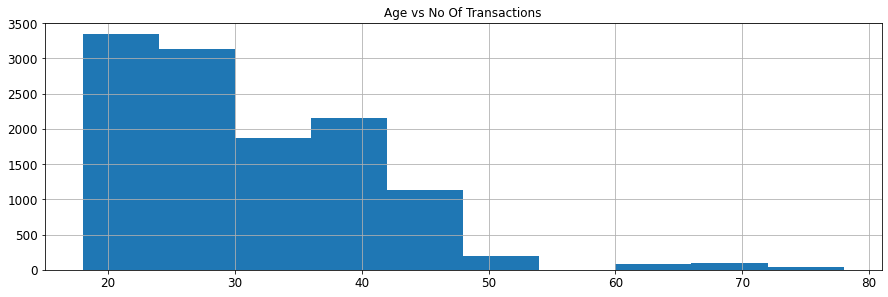

In [29]:
from pandas import Series
from matplotlib import pyplot
pyplot.figure(figsize=(15,10))

pyplot.subplot(211)
pyplot.title("Age vs No Of Transactions")
data.age.hist()
pyplot.show()

#### We can see that as age increases the No of transactions decreases

In [30]:
df_date_count = data.groupby("date").count()

In [31]:
trans_vol = df_date_count["customer_id"].mean()
n_points = len(df_date_count.index)

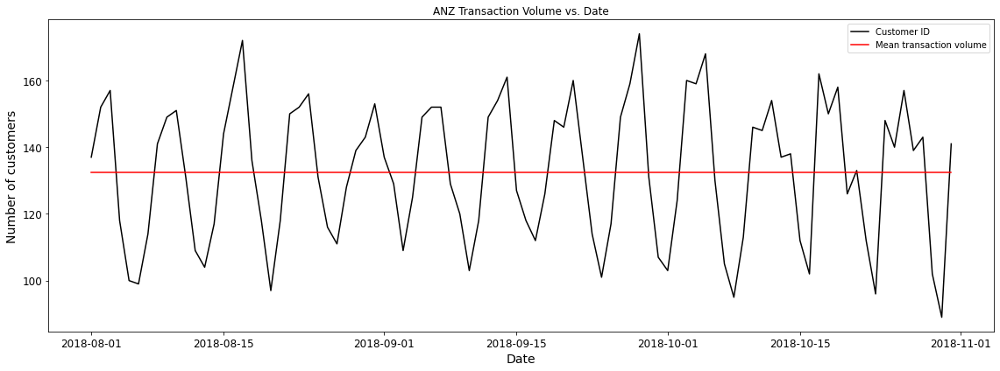

In [32]:
#we try to find out the mean transaction volume based on date
plt.figure(figsize=(16,6))
plt.plot(df_date_count.index, df_date_count["customer_id"], c="black", label = "Customer ID")
plt.plot(df_date_count.index, np.linspace(trans_vol,trans_vol,n_points), c="r", label = "Mean transaction volume")
plt.title("ANZ Transaction Volume vs. Date")
plt.xlabel("Date")
plt.ylabel("Number of customers")
plt.legend()
plt.tight_layout()

In [33]:
df_date_mean = data.groupby("date").mean()

In [34]:
trans_amt = df_date_mean["amount"].mean()
n_points = len(df_date_count.index)

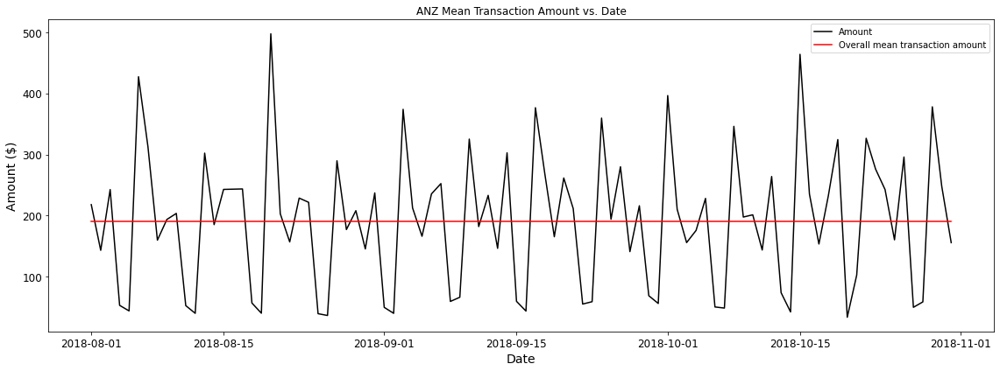

In [35]:
# We try to findout mean Transaction amount based on date
plt.figure(figsize=(16,6))
plt.plot(df_date_count.index, df_date_mean["amount"], c="black", label = "Amount")
plt.plot(df_date_count.index, np.linspace(trans_amt,trans_amt,n_points), c="r", label = "Overall mean transaction amount")
plt.title("ANZ Mean Transaction Amount vs. Date")
plt.xlabel("Date")
plt.ylabel("Amount ($)")
plt.legend()
plt.tight_layout()

In [36]:
data[['cust_longitude','cust_latitude']] = data.long_lat.str.split(expand=True) 
data['cust_latitude_unchanged'] = data['cust_latitude']
data['cust_latitude'] = pd.to_numeric(data['cust_latitude'])
data['cust_latitude'] = data['cust_latitude'] * (-1)

data[['mrchnt_longitude','mrchnt_latitude']] = data.merchant_long_lat.str.split(expand=True)
data['mrchnt_latitude_unchanged'] = data['mrchnt_latitude']
data['mrchnt_latitude'] = pd.to_numeric(data['mrchnt_latitude'])
data['mrchnt_latitude'] = data['mrchnt_latitude'] * (-1) 

# Eucledian distance b/w merchant and payee
data['latitude_diff_kms'] = abs(data['mrchnt_latitude']-data['cust_latitude'])*111
data['longitude_diff_kms'] = abs(data['mrchnt_latitude']-data['cust_latitude'])*111
data['dist_cust_merchant'] = (((data['longitude_diff_kms']*data['longitude_diff_kms']) + (data['latitude_diff_kms']*data['latitude_diff_kms']))**(1/2))
data.head(20)

,account,long_lat,txn_description,merchant_id,first_name,balance,date,gender,age,merchant_suburb,...,time,cust_longitude,cust_latitude,cust_latitude_unchanged,mrchnt_longitude,mrchnt_latitude,mrchnt_latitude_unchanged,latitude_diff_kms,longitude_diff_kms,dist_cust_merchant
0,ACC-1598451071,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,Diana,35.39,2018-08-01,F,26,Ashmore,...,0 days 01:01:15,153.41,27.95,-27.95,153.38,27.99,-27.99,4.44,4.44,6.279108
1,ACC-1598451071,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,Diana,21.20,2018-08-01,F,26,Sydney,...,0 days 01:13:45,153.41,27.95,-27.95,151.21,33.87,-33.87,657.12,657.12,929.308016
2,ACC-1222300524,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,Michael,5.71,2018-08-01,M,38,Sydney,...,0 days 01:26:15,151.23,33.94,-33.94,151.21,33.87,-33.87,7.77,7.77,10.988439
3,ACC-1037050564,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,Rhonda,2117.22,2018-08-01,F,40,Buderim,...,0 days 01:38:45,153.10,27.66,-27.66,153.05,26.68,-26.68,108.78,108.78,153.838151
4,ACC-1598451071,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,Diana,17.95,2018-08-01,F,26,Mermaid Beach,...,0 days 01:51:15,153.41,27.95,-27.95,153.44,28.06,-28.06,12.21,12.21,17.267548
5,ACC-1608363396,151.22 -33.87,PAYMENT,NaN,Robert,1705.43,2018-08-01,M,20,NaN,...,0 days 02:00:00,151.22,33.87,-33.87,NaN,NaN,NaN,NaN,NaN,NaN
6,ACC-2776252858,144.95 -37.76,SALES-POS,3aa18033-a0a9-4190-a117-b7caaf4d07e3,Kristin,1248.36,2018-08-01,F,43,Kalkallo,...,0 days 02:23:04,144.95,37.76,-37.76,144.95,37.53,-37.53,25.53,25.53,36.104872
7,ACC-2776252858,144.95 -37.76,POS,ee58145d-26e8-4b01-9cd9-62378014f21d,Kristin,1232.75,2018-08-01,F,43,Melbourne,...,0 days 04:11:25,144.95,37.76,-37.76,144.96,37.81,-37.81,5.55,5.55,7.848885
8,ACC-182446574,116.06 -32.00,POS,cfbf535e-caa8-499f-9d41-bbdc2b836d85,Tonya,213.16,2018-08-01,F,27,Yokine,...,0 days 04:40:00,116.06,32.00,-32.00,115.85,31.90,-31.9,11.10,11.10,15.697771
9,ACC-602667573,151.23 -33.96,INTER BANK,NaN,Michael,466.58,2018-08-01,M,40,NaN,...,0 days 06:00:00,151.23,33.96,-33.96,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
data['hour'] = 0
data['hour'] = data['extraction'].astype(str)
data['hour'] = data['hour'].str.slice(start = 11, stop = 13)
print(data['hour'].head())

0    01
1    01
2    01
3    01
4    01
Name: hour, dtype: object


In [38]:
data['month'] = 0
data['month'] = data['date'].astype(str)
data['month'] = data['month'].str.slice(start = 0, stop = 7)
print(data['month'])

0        2018-08
1        2018-08
2        2018-08
3        2018-08
4        2018-08
          ...   
12038    2018-10
12039    2018-10
12040    2018-10
12041    2018-10
12042    2018-10
Name: month, Length: 12043, dtype: object


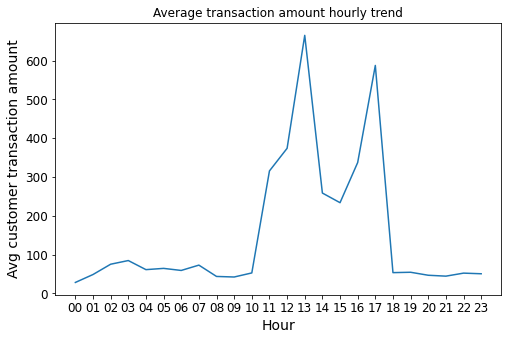

In [39]:
# We find out the Average transaction amount based on hourly trend
plotdata = data.groupby('hour', as_index=False)['amount'].mean()
plt.figure(figsize=(8,5))
plt.plot(plotdata['hour'],plotdata['amount'])
xlab = 'Hour'
ylab = 'Avg customer transaction amount'
title = 'Average transaction amount hourly trend'
# Add axis labels
plt.xlabel(xlab)
plt.ylabel(ylab)
plt.title(title)
plt.show()

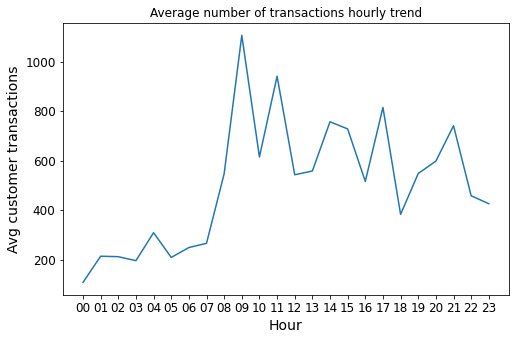

In [40]:
# We find out Average number of transactions hourly trend
plotdata = data.groupby('hour', as_index=False)['transaction_id'].count()
plt.figure(figsize=(8,5))
plt.plot(plotdata['hour'],plotdata['transaction_id'])
xlab = 'Hour'
ylab = 'Avg customer transactions'
title = 'Average number of transactions hourly trend'
# Add axis labels
plt.xlabel(xlab)
plt.ylabel(ylab)
plt.title(title)
plt.show()

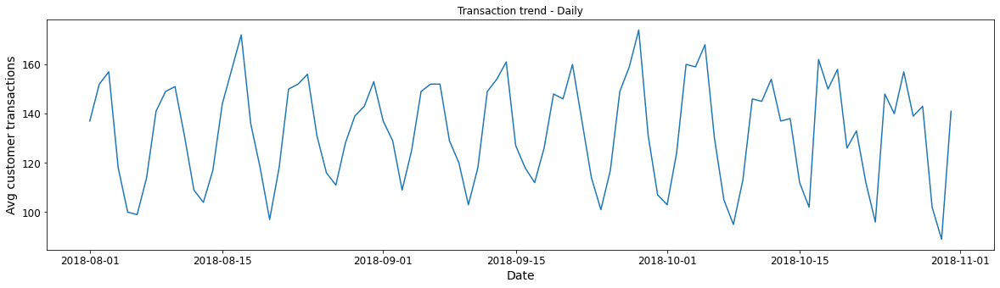

         date  transaction_id
0  2018-08-01             137
1  2018-08-02             152
2  2018-08-03             157
3  2018-08-04             118
4  2018-08-05             100
5  2018-08-06              99
6  2018-08-07             114
7  2018-08-08             141
8  2018-08-09             149
9  2018-08-10             151
10 2018-08-11             131
11 2018-08-12             109
12 2018-08-13             104
13 2018-08-14             117


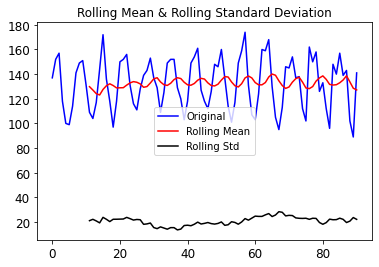

ADF Statistic: -3.19422390769844
p-value: 0.020321466056311147
Critical Values:
	1%: -3.512738056978279
	5%: -2.8974898650628984
	10%: -2.585948732897085


C:\Users\Vamsi\anaconda3\lib\site-packages\statsmodels\tsa\arima_model.py:472: FutureWarning: 
statsmodels.tsa.arima_model.ARMA and statsmodels.tsa.arima_model.ARIMA have
been deprecated in favor of statsmodels.tsa.arima.model.ARIMA (note the .
between arima and model) and
statsmodels.tsa.SARIMAX. These will be removed after the 0.12 release.

statsmodels.tsa.arima.model.ARIMA makes use of the statespace framework and
is both well tested and maintained.

To silence this warning and continue using ARMA and ARIMA until they are
removed, use:

import warnings
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARMA',
                        FutureWarning)
warnings.filterwarnings('ignore', 'statsmodels.tsa.arima_model.ARIMA',
                        FutureWarning)

  warnings.warn(ARIMA_DEPRECATION_WARN, FutureWarning)


                              ARMA Model Results                              
Dep. Variable:         transaction_id   No. Observations:                   91
Model:                     ARMA(7, 0)   Log Likelihood                -329.247
Method:                       css-mle   S.D. of innovations              8.677
Date:                Thu, 01 Jul 2021   AIC                            676.495
Time:                        14:42:43   BIC                            699.093
Sample:                             0   HQIC                           685.612
                                                                              
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                  131.9904      1.229    107.365      0.000     129.581     134.400
ar.L1.transaction_id     0.2222      0.083      2.672      0.008       0.059       0.385
ar.L2.transa

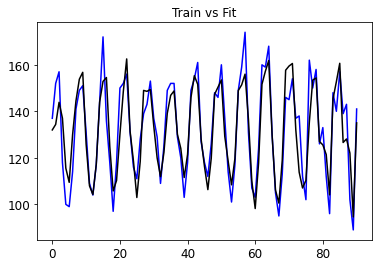

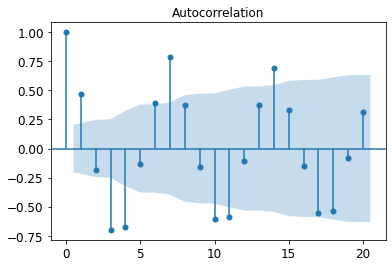

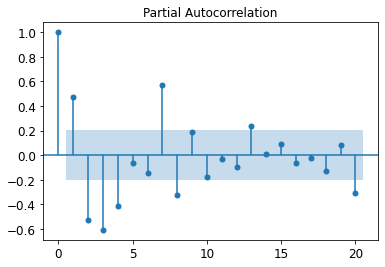

In [41]:
# In this part of the project we perform time series based analysis
plotdata = data.groupby('date', as_index=False)['transaction_id'].count()
plt.figure(figsize=(20,5))
plt.plot(plotdata['date'],plotdata['transaction_id'])
xlab = 'Date'
ylab = 'Avg customer transactions'
title = 'Transaction trend - Daily'
# Add axis labels
plt.xlabel(xlab)
plt.ylabel(ylab)
plt.title(title)
plt.show()

print(plotdata.head(14))


from pandas.plotting import autocorrelation_plot
from statsmodels.tsa.arima_model import ARIMA
#from statsmodels.tsa.statespace import SARIMAX
import statsmodels.api as sm
#outliers = anz_data['amount'].loc[(anz_data['amount'] > (mean+3*std_dev)) | (anz_data['amount'] < (mean-3*std_dev))]

x = plotdata['transaction_id']

rolling_mean = x.rolling(window = 12).mean()
rolling_std = x.rolling(window = 12).std()
plt.plot(x, color = 'blue', label = 'Original')
plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
plt.legend(loc = 'best')
plt.title('Rolling Mean & Rolling Standard Deviation')
plt.show()

from statsmodels.tsa.stattools import adfuller
result = adfuller(x)
print('ADF Statistic: {}'.format(result[0]))
print('p-value: {}'.format(result[1]))
print('Critical Values:')
for key, value in result[4].items():
    print('\t{}: {}'.format(key, value))

model = ARIMA(x, order=(7,0,0))
model_fit = model.fit(disp=0)

plt.plot(x, color = 'blue')
#plt.plot(model_fit.fittedvalues, color='red')
plt.plot(model_fit.fittedvalues, color='black')

plt.title('Train vs Fit')
print(model_fit.summary())


from statsmodels.graphics.tsaplots import plot_acf , plot_pacf
print(plot_acf(x, lags = 20))
print(plot_pacf(x, lags = 20))


In [42]:
df_merchant = data.loc[data['txn_description'].isin(['Pos','SALES-POS'])]

In [43]:
df_merchant.groupby(['customer_id', 'first_name', 'age']).count()['transaction_id'].sort_values(ascending=False).head(10)

customer_id     first_name  age
CUS-2487424745  Diana       26     272
CUS-3026014945  Tonya       27     123
CUS-2142601169  Michael     38     122
CUS-860700529   Jeffrey     30     109
CUS-1614226872  Rhonda      40     109
CUS-3378712515  Kimberly    24     106
CUS-2695611575  Joseph      37     101
CUS-51506836    Richard     24      96
CUS-1196156254  Jessica     34      89
CUS-1669695324  Tiffany     25      88
Name: transaction_id, dtype: int64

In [44]:
top_pos_cust_id = df_merchant.groupby(['customer_id','first_name']).count()['transaction_id'].sort_values(ascending=False).head(5).index.to_list()

In [45]:
top_pos_cust_id

[('CUS-2487424745', 'Diana'),
 ('CUS-3026014945', 'Tonya'),
 ('CUS-2142601169', 'Michael'),
 ('CUS-860700529', 'Jeffrey'),
 ('CUS-1614226872', 'Rhonda')]

In [46]:
import folium
from folium.plugins import BeautifyIcon

In [47]:
def plot_map(cust_list):
    i, j = cust_list
    j = j.lower()
    j = pd.DataFrame(df_merchant[df_merchant['customer_id']==i])
    #print(j)

    m = folium.Map([-31, 133], zoom_start=4)
    for index, row in j.iterrows():

        icon_circle = BeautifyIcon(
        icon_shape='circle-dot', 
        border_color='#FF5050', 
        border_width=6,
        )

        folium.Marker([row['merchant_lat'], row['merchant_long']],
                    tooltip=[row['merchant_suburb'],str(row['extraction'])],
                    icon= icon_circle).add_to(m)

        
        folium.Marker([row['customer_lat'], row['customer_long']],
                      popup=row['first_name'],
                      tooltip=row['first_name']).add_to(m)


        return m

In [48]:
plot_map(top_pos_cust_id[0])

In [49]:
plot_map(top_pos_cust_id[1])

In [50]:
plot_map(top_pos_cust_id[2])

In [51]:
plot_map(top_pos_cust_id[3])

In [52]:
cust_map = folium.Map([15, 0], zoom_start=1)

In [53]:
for index, row in data.iterrows():
    
    icon_circle = BeautifyIcon(
        icon_shape='circle-dot', 
        border_color='#009900', 
        border_width=6,
        )
    
    folium.Marker([row['customer_lat'], row['customer_long']],
              #popup=row['first_name'],
              tooltip=row['first_name'], 
              icon= icon_circle).add_to(cust_map)

In [54]:
cust_map
